In [1]:
import tweepy

In [2]:
#You should give your Twitter Developer Credientials here in order to retreive tweets
ACCESS_TOKEN = ""
ACCESS_TOKEN_SECRET = ""
CONSUMER_KEY = ""
CONSUMER_SECRET = ""


In [3]:
from tweepy.streaming import StreamListener
from tweepy import OAuthHandler
from tweepy import Stream
from tweepy import API
from tweepy import Cursor


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
#This is a class for streaming and processing live tweets.
class TwitterStreamer():
    """
    Class for streaming and processing live tweets.
    """
    def __init__(self):
        pass

    def stream_tweets(self, fetched_tweets_filename, hash_tag_list):
        # This handles Twitter authetification and the connection to Twitter Streaming API
        listener = StdOutListener(fetched_tweets_filename)
        auth = OAuthHandler(CONSUMER_KEY,CONSUMER_SECRET)
        auth.set_access_token(ACCESS_TOKEN, ACCESS_TOKEN_SECRET)
        stream = Stream(auth, listener)

        # This line filter Twitter Streams to capture data by the keywords: 
        stream.filter(track=hash_tag_list)



In [6]:
# # # # TWITTER STREAM LISTENER
class StdOutListener(StreamListener):
    """
    This is a basic listener that just prints received tweets to stdout.
    """
    def __init__(self, fetched_tweets_filename):
        self.fetched_tweets_filename = fetched_tweets_filename

    def on_data(self, data):
        try:
            print(data)
            with open(self.fetched_tweets_filename, 'a') as tf:
                tf.write(data)
            return True
        except BaseException as e:
            print("Error on_data %s" % str(e))
        return True


In [ ]:
if __name__ == '__main__':
 
    # Authenticate using config.py and connect to Twitter Streaming API.
    hash_tag_list = ["DhoniRetires","RainaRetires","ThankYouMSD"]
    fetched_tweets_filename = "tweets.json"

    twitter_streamer = TwitterStreamer()
    twitter_streamer.stream_tweets(fetched_tweets_filename, hash_tag_list)





{"created_at":"Mon Aug 17 11:14:41 +0000 2020","id":1295318127018827776,"id_str":"1295318127018827776","text":"RT @ICC: Mahendra Singh Dhoni \u2013 one of the greats.\n\n#DhoniRetires https:\/\/t.co\/qOiWqNQWKW","source":"\u003ca href=\"http:\/\/twitter.com\/download\/android\" rel=\"nofollow\"\u003eTwitter for Android\u003c\/a\u003e","truncated":false,"in_reply_to_status_id":null,"in_reply_to_status_id_str":null,"in_reply_to_user_id":null,"in_reply_to_user_id_str":null,"in_reply_to_screen_name":null,"user":{"id":890091088966541312,"id_str":"890091088966541312","name":"Abhilash Ponnam","screen_name":"abhilash_ponnam","location":"Hyderabad, India","url":null,"description":"INDIAN BANK assistant manager (probationary officer)","translator_type":"none","protected":false,"verified":false,"followers_count":14,"friends_count":115,"listed_count":0,"favourites_count":647,"statuses_count":680,"created_at":"Wed Jul 26 06:07:07 +0000 2017","utc_offset":null,"time_zone":null,"geo_enabled":false,"l

KeyboardInterrupt: ignored

In [7]:

import json
tweets = []
for line in open('drive/My Drive/tweets.json','r'):
  tweets.append(json.loads(line))

In [8]:
tweets

[{'contributors': None,
  'coordinates': None,
  'created_at': 'Sun Aug 16 15:06:36 +0000 2020',
  'entities': {'hashtags': [{'indices': [90, 100], 'text': 'TeamIndia'}],
   'symbols': [],
   'urls': [],
   'user_mentions': [{'id': 185142711,
     'id_str': '185142711',
     'indices': [3, 8],
     'name': 'BCCI',
     'screen_name': 'BCCI'},
    {'id': 71201743,
     'id_str': '71201743',
     'indices': [109, 118],
     'name': 'Virat Kohli',
     'screen_name': 'imVkohli'}]},
  'favorite_count': 0,
  'favorited': False,
  'filter_level': 'low',
  'geo': None,
  'id': 1295014101689569281,
  'id_str': '1295014101689569281',
  'in_reply_to_screen_name': None,
  'in_reply_to_status_id': None,
  'in_reply_to_status_id_str': None,
  'in_reply_to_user_id': None,
  'in_reply_to_user_id_str': None,
  'is_quote_status': False,
  'lang': 'en',
  'place': None,
  'quote_count': 0,
  'reply_count': 0,
  'retweet_count': 0,
  'retweeted': False,
  'retweeted_status': {'contributors': None,
   'co

In [10]:
x = []
for i in range(len(tweets)):
  x.append(tweets[i]['text'])

In [11]:
import nltk
import nltk.corpus

In [12]:
len(x)

5853

In [13]:
removed =[]
noise_list = ["is", "a", "this", "...","RT","you"] 
def _remove_noise(input_text):
    words = input_text.split() 
    noise_free_words = [word for word in words if word not in noise_list] 
    noise_free_text = " ".join(noise_free_words) 
    return noise_free_text
for i in x:
 removed.append( _remove_noise(i))

In [14]:
removed

['@BCCI: "I\'ve always said and I will say it again, will always be my Captain," #TeamIndia Skipper @imVkohli pays his tribute to…',
 '@delhichatter 😃',
 '@SadhguruJV: #MSDhoni not only legend in Cricket but Great leader &amp; manager of men. Being young, hope your leadership capabilities w…',
 '@YashMor5: Wishing splendid second innings. You gave so much to the game and brought cheer to the nation. You also inspired gene…',
 '@Swatisahu08: उसने एक ख्व़ाब देखा था.., क्रिकेट के मैदान में आने का..! उसने एक ख्व़ाब देखा था.., वर्ल्ड कप जीत लाने का..! सच किये ख्व़ाब…',
 '@IrfanPathan: It was privilege to have played with friend and cricketer who gave many laurels to our country on the cricketing fie…',
 '@pondy_partner: Impossible fanbase for @msdhoni #Dhoni #MSDhoni #DhoniRaina #DhoniRetirment #msdhoniretirement #msdianforever #ThankYo…',
 'Rap Tribute to the legend. @msdhoni @ICC @BCCI @imVkohli @sachin_rt @harbhajan_singh @YUVSTRONG12 @virendersehwag… https://t.co/aZV40P4TD8',
 '@ICC: #D

In [15]:
import pandas as pd
data = pd.DataFrame(x)

In [16]:
def punc(df,stri):
    df[stri] = df[stri].str.lower().str.replace('[^a-z]', ' ')
    df[stri] = df[stri].str.lower().str.replace('[^\w\s]',' ')
    df[stri] = df[stri].str.lower().str.replace(r'<.*?>',' ')
    df[stri] = df[stri].str.lower().str.replace(' br ',' ')
    return df

In [17]:
data1 = punc(data,0)

In [18]:
data1

,0
0,rt bcci i ve always said this and i will sa...
1,delhichatter
2,rt sadhgurujv msdhoni not only a legend in ...
3,rt yashmor wishing you a splendid second in...
4,rt swatisahu ...
...,...
5848,rt icc mahendra singh dhoni one of the gre...
5849,rt icc mahendra singh dhoni one of the gre...
5850,rt icc mahendra singh dhoni one of the gre...
5851,rt icc mahendra singh dhoni one of the gre...


In [19]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
stop = stopwords.words('english')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [20]:
def stopi(df,stri): 
    df[stri] = df[stri].apply(lambda x: " ".join(x for x in x.split() if x not in stop))
    return df

In [21]:
data2 = stopi(data1,0)


In [22]:
data2

,0
0,rt bcci always said say always captain teamind...
1,delhichatter
2,rt sadhgurujv msdhoni legend cricket great lea...
3,rt yashmor wishing splendid second innings gav...
4,rt swatisahu
...,...
5848,rt icc mahendra singh dhoni one greats dhonire...
5849,rt icc mahendra singh dhoni one greats dhonire...
5850,rt icc mahendra singh dhoni one greats dhonire...
5851,rt icc mahendra singh dhoni one greats dhonire...


In [23]:
eliminate = ['icc','mahendra','singh','dhoni','rt','msdhoni','suresh','raina','sraina','msd','mahi','bcci','ms','said','imvkohli','kumar','https','amp','qoiwqnqwkw','liked tweets','sadhguruvj','eugh','dyv','bhi',
             'mbthankingvj','alwaysramcharan','sadhgurujv','gic','didyouknow','beca','iamamirofficial','kohli message','co']

In [24]:
def elimi(df,stri): 
    df[stri] = df[stri].apply(lambda x: " ".join(x for x in x.split() if x not in eliminate))
    return df

In [25]:
data3 = elimi(data2,0)

In [26]:
data3

,0
0,always say always captain teamindia skipper pa...
1,delhichatter
2,legend cricket great leader manager men young ...
3,yashmor wishing splendid second innings gave m...
4,swatisahu
...,...
5848,one greats dhoniretires
5849,one greats dhoniretires
5850,one greats dhoniretires
5851,one greats dhoniretires


In [27]:
def word_count(df):
    
    counts = dict()
    for str in df:
      words = str.split()
      for word in words:
        if word in counts:
          counts[word] += 1
        else:
          counts[word] = 1

    return counts

In [28]:
word_count(data3[0])

{'always': 1675,
 'say': 785,
 'captain': 1058,
 'teamindia': 923,
 'skipper': 729,
 'pays': 723,
 'tribute': 841,
 'delhichatter': 1,
 'legend': 266,
 'cricket': 719,
 'great': 204,
 'leader': 208,
 'manager': 156,
 'men': 168,
 'young': 161,
 'hope': 178,
 'leadership': 160,
 'capabilities': 156,
 'w': 184,
 'yashmor': 1,
 'wishing': 40,
 'splendid': 1,
 'second': 8,
 'innings': 16,
 'gave': 9,
 'much': 27,
 'game': 71,
 'brought': 5,
 'cheer': 1,
 'nation': 70,
 'also': 22,
 'inspired': 15,
 'gene': 1,
 'swatisahu': 3,
 'irfanpathan': 19,
 'privilege': 4,
 'played': 29,
 'friend': 14,
 'cricketer': 33,
 'many': 68,
 'laurels': 4,
 'country': 35,
 'cricketing': 27,
 'fie': 4,
 'pondy': 30,
 'partner': 32,
 'impossible': 18,
 'fanbase': 18,
 'dhoniraina': 129,
 'dhoniretirment': 31,
 'msdhoniretirement': 23,
 'msdianforever': 31,
 'thankyo': 18,
 'rap': 1,
 'sachin': 12,
 'harbhajan': 1,
 'yuvstrong': 8,
 'virendersehwag': 1,
 'azv': 1,
 'p': 20,
 'td': 1,
 'pulled': 99,
 'stumpings':

In [ ]:
pip install wordcloud

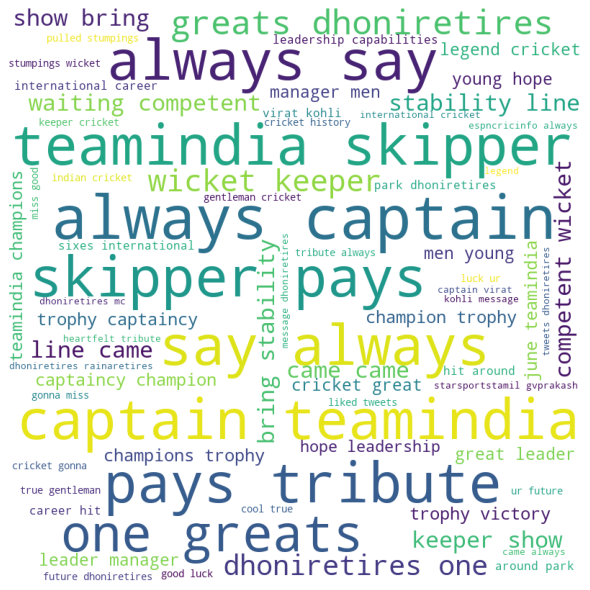

In [29]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd 
  
comment_words = ''
for val in data3[0]: 

    val = str(val) 

    tokens = val.split() 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(comment_words) 
  
                     
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 